In [47]:
import tensorflow as tf

import numpy as np
import matplotlib as mpl

import IPython.display as display
import PIL.Image

In [48]:
url = 'https://storage.googleapis.com/download.tensorflow.org/example_images/YellowLabradorLooking_new.jpg'

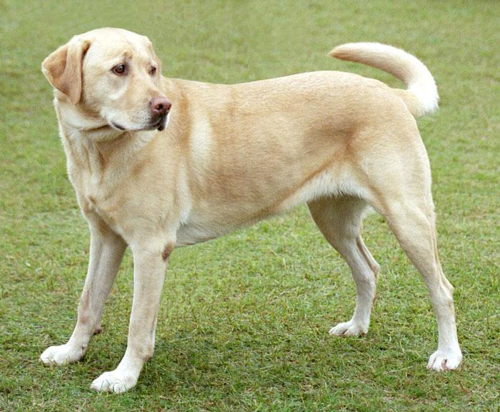

In [49]:
def download(url, max_dim=None):
  name = url.split('/')[-1]
  img_path = tf.keras.utils.get_file(name, origin=url)

  img = PIL.Image.open(img_path)

  if max_dim: img.thumbnail((max_dim, max_dim))

  return np.array(img)

def deprocess(img): return tf.cast(255 * (img + 1.0) / 2.0, tf.uint8)

def show(img): display.display(PIL.Image.fromarray(np.array(img)))

og_img = download(url, max_dim=500)
show(og_img)

In [50]:
# use any pretrained model
base_model = tf.keras.applications.InceptionV3(include_top=False, weights='imagenet')

In [51]:
# deeper layers = higher level features + takes longer for gradient computation (cuz it's deeper)
names = ["mixed3", "mixed5"]
layers = [base_model.get_layer(name).output for name in names]

# want to optimize so the activations in these layers is high
dream_model = tf.keras.Model(inputs=base_model.input, outputs=layers)

In [52]:
def calc_loss(img, model):
  img_batch = tf.expand_dims(img, axis=0)

  layer_activs = model(img_batch)
  if len(layer_activs) == 1:
    layer_activs = [layer_activs]

  losses = []
  # normalize the loss (reduce_mean) so larger layers don't outweigh smaller ones
  for act in layer_activs: losses.append(tf.math.reduce_mean(act))

  return tf.reduce_sum(losses)

In [53]:
class DeepDream(tf.Module):
  def __init__(self, model):
    self.model = model

  @tf.function(
      # ensure function isn't retraced for different image sizes or `steps/step_size` values
      input_signature=(
          tf.TensorSpec(shape=[None, None, 3], dtype=tf.float32),
          tf.TensorSpec(shape=[], dtype=tf.int32),
          tf.TensorSpec(shape=[], dtype=tf.float32)
      )
  )
  def __call__(self, img, steps, step_size):
    print('Tracing')

    loss = tf.constant(0.0)
    for n in tf.range(steps):
      with tf.GradientTape() as tape:
        tape.watch(img)  # tape only watches Variables by default
        loss = calc_loss(img, self.model)

      grads = tape.gradient(loss, img)  # want to change input image to increase activations
      grads /= tf.math.reduce_std(grads) + 1e-8  # normalize

      img = img + grads * step_size  # perform gradient *ascent* to increase activations
      img = tf.clip_by_value(img, -1, 1)

      return loss, img

In [54]:
deepdream = DeepDream(dream_model)

In [55]:
def run_deep_dream_simple(img, steps=100, step_size=0.01):
  # convert to what the model expects
  img = tf.keras.applications.inception_v3.preprocess_input(img)
  img = tf.convert_to_tensor(img)

  step_size = tf.convert_to_tensor(step_size)
  steps_remaining = steps

  step = 0
  while steps_remaining:
    run_steps = tf.constant(min(steps_remaining, 100))

    steps_remaining -= run_steps
    step += run_steps

    loss, img = deepdream(img, run_steps, tf.constant(step_size))

    # display.clear_output(wait=True)
    show(deprocess(img))
    print(f"Step {step}, loss {loss}")

  result = deprocess(img)
  # display.clear_output(wait=True)
  show(result)

  return result

Tracing


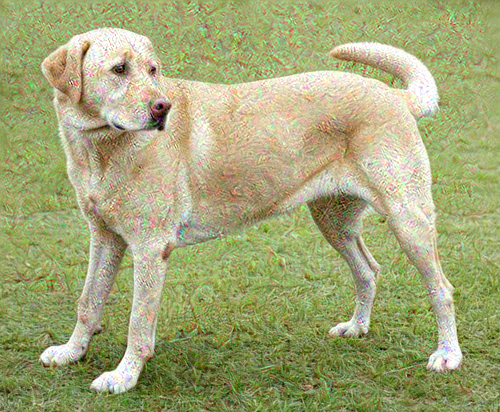

Step 100, loss 0.5951964855194092


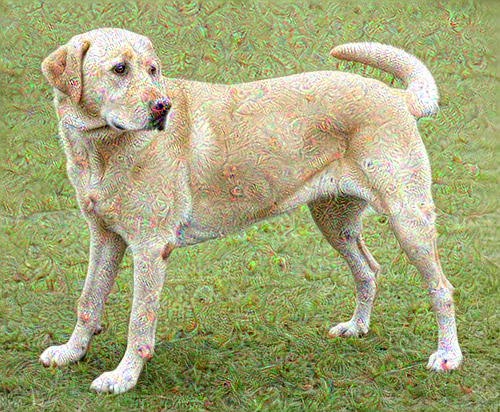

Step 200, loss 0.6789766550064087


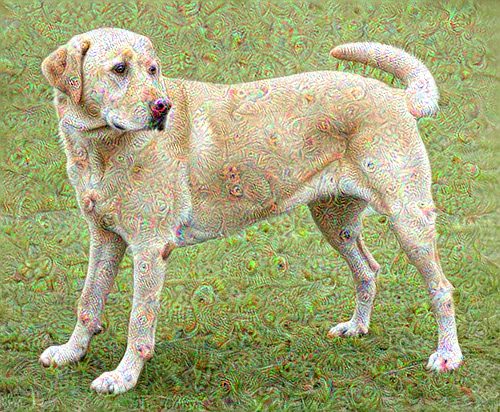

Step 300, loss 0.8352556824684143


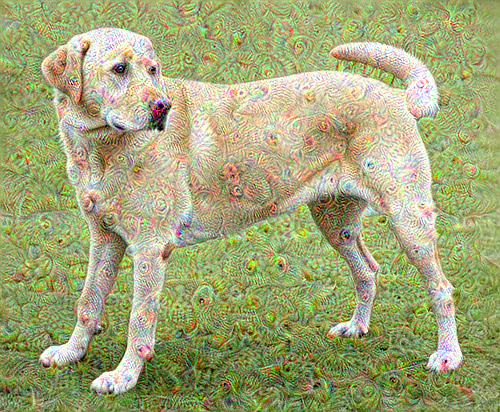

Step 400, loss 0.9937790036201477


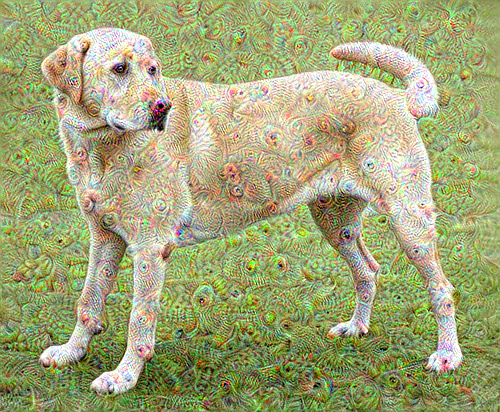

Step 500, loss 1.1328068971633911


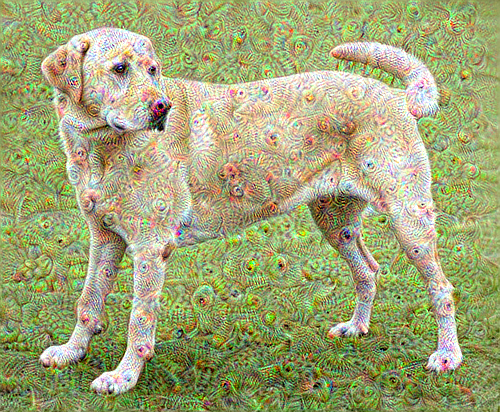

Step 600, loss 1.263558030128479


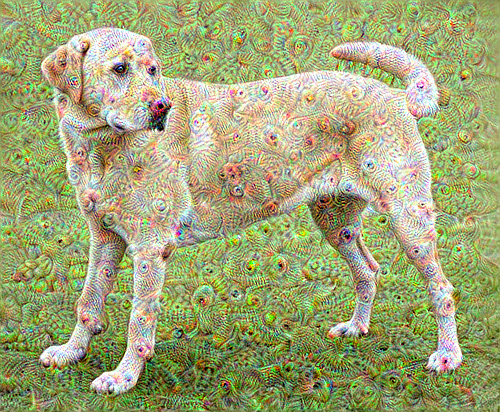

Step 700, loss 1.3783583641052246


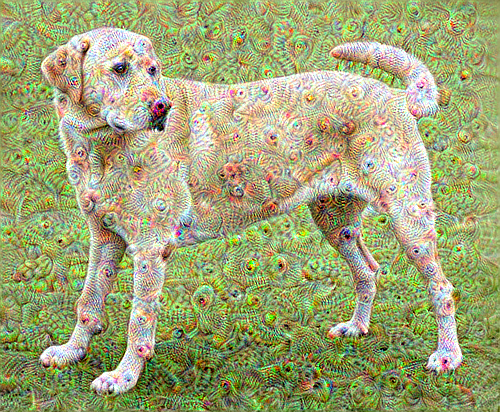

Step 800, loss 1.4796438217163086


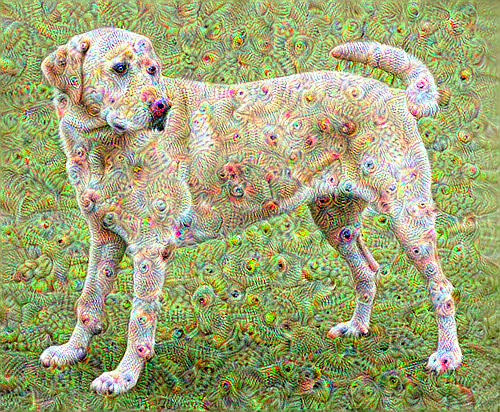

Step 900, loss 1.5776485204696655


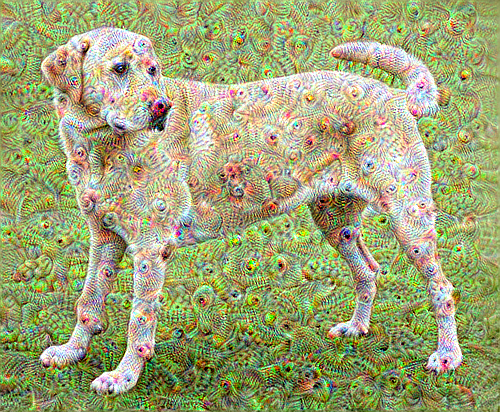

Step 1000, loss 1.6656904220581055


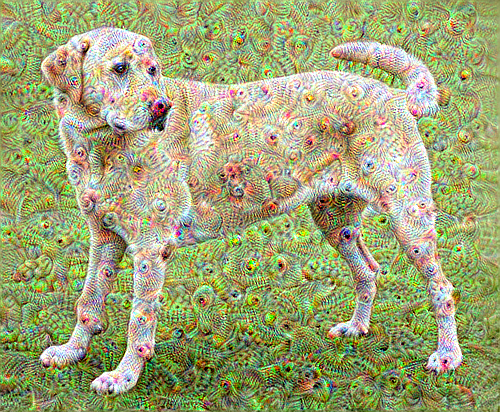

In [56]:
dream_img = run_deep_dream_simple(img=og_img, steps=1000, step_size=0.1)

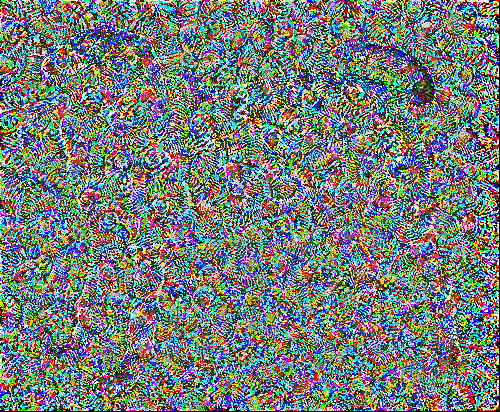

In [57]:
show(og_img - dream_img)

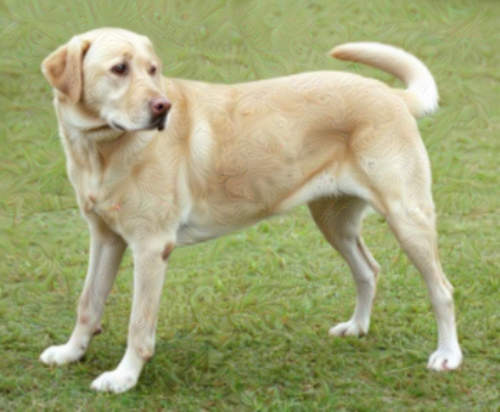

Duration:  14.026267051696777


In [58]:
# issues in above:
#   output is noisy (can address it using tf.image.total_variation loss)
#   image is low res
#   patterns appear at same granularity
# solution: apply gradient ascent at different scales

import time
start = time.time()

OCTAVE_SCALE = 1.30

img = tf.constant(np.array(og_img))
base_shape = tf.shape(img)[:-1]
float_base_shape = tf.cast(base_shape, tf.float32)

for n in range(-2, 3):
  new_shape = tf.cast(float_base_shape * (OCTAVE_SCALE**n), tf.int32)
  img = tf.image.resize(img, new_shape).numpy()

  img = run_deep_dream_simple(img, 50, 0.01)


display.clear_output(wait=True)

img = tf.image.resize(img, base_shape)
img = tf.image.convert_image_dtype(img / 255.0, dtype=tf.uint8)

show(img)

end = time.time()
print("Duration: ", end - start)

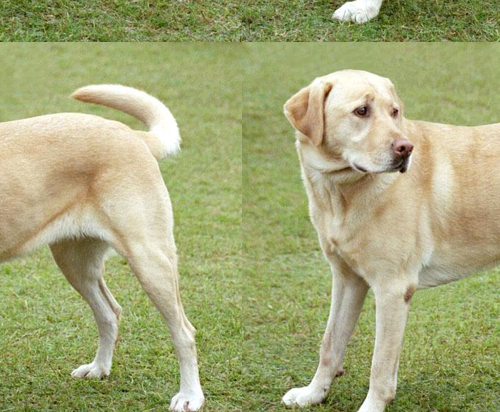

In [65]:
# above way to scale isn't applicable to large images or for many octaves
# solution: scale up with tiles

def random_roll(img, maxroll):
  shift = tf.random.uniform(shape=[2], minval=-maxroll, maxval=maxroll, dtype=tf.int32)
  img_rolled = tf.roll(img, shift=shift, axis=[0, 1])
  return shift, img_rolled

shift, img_rolled = random_roll(np.array(og_img), 512)
show(img_rolled)

In [69]:
class TiledGradients(tf.Module):
  def __init__(self, model): self.model = model

  @tf.function(
      input_signature=(
          tf.TensorSpec(shape=[None, None, 3], dtype=tf.float32),
          tf.TensorSpec(shape=[2], dtype=tf.int32),
          tf.TensorSpec(shape=[], dtype=tf.int32)
      )
  )
  def __call__(self, img, img_size, tile_size=512):
    shift, img_rolled = random_roll(img, tile_size)

    grads = tf.zeros_like(img_rolled)

    # skip the last tile unless there's only 1 tile
    xs = tf.range(0, img_size[1], tile_size)[:-1]
    if not tf.cast(len(xs), bool): xs = tf.constant([0])
    ys = tf.range(0, img_size[0], tile_size)[:-1]
    if not tf.cast(len(ys), bool): ys = tf.constant([0])

    for x in xs:
      for y in ys:
        with tf.GradientTape() as tape:
          tape.watch(img_rolled)

          img_tile = img_rolled[y:y+tile_size, x:x+tile_size]  # get current tile
          loss = calc_loss(img_tile, self.model)

        grads = grads + tape.gradient(loss, img_rolled)

    grads = tf.roll(grads, shift=-shift, axis=[0, 1])  # unshift
    grads /= tf.math.reduce_std(grads) + 1e-8

    return grads

In [70]:
get_tiled_grads = TiledGradients(dream_model)

In [62]:
def run_deep_dream_with_octaves(img, steps_per_octave=100, step_size=0.01,
                                octaves=range(-2, 3), octave_scale=1.3):
  base_shape = tf.shape(img)
  img = tf.keras.utils.img_to_array(img)
  img = tf.keras.applications.inception_v3.preprocess_input(img)

  initial_shape = img.shape[:-1]
  img = tf.image.resize(img, initial_shape)
  for octave in octaves:
    new_size = tf.cast(tf.convert_to_tensor(base_shape[:-1]), tf.float32) * (octave_scale**octave)
    new_size = tf.cast(new_size, tf.int32)
    img = tf.image.resize(img, new_size)

    for step in range(steps_per_octave):
      grads = get_tiled_grads(img, new_size)
      img = img + grads*step_size
      img = tf.clip_by_value(img, -1, 1)

      if step % 10 == 0:
        display.clear_output(wait=True)
        show(deprocess(img))
        print(f"Octave {octave}, Step {step}")

  result = deprocess(img)
  return result

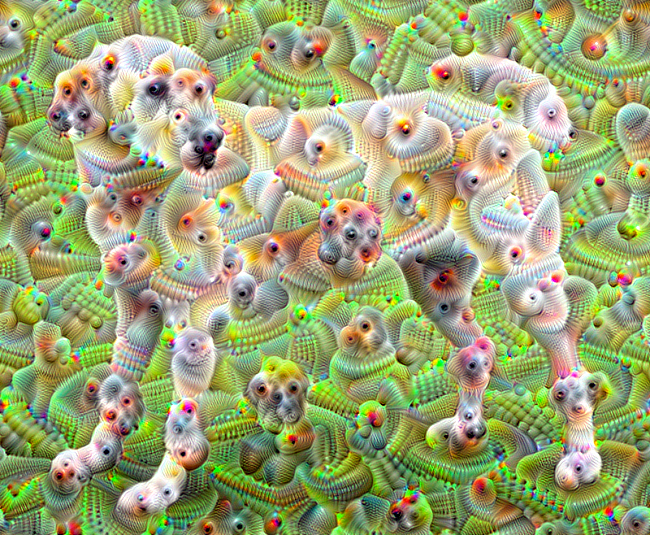

Octave 1, Step 80


KeyboardInterrupt: 

In [71]:
img = run_deep_dream_with_octaves(img=og_img, step_size=0.01)

display.clear_output(wait=True)
img = tf.image.resize(img, base_shape)
img = tf.image.convert_image_dtype(img / 255.0, tf.uint8)
show(img)